In [1]:
import anndata as ad
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

from scipy.stats import spearmanr
from scipy.stats import pearsonr
from scipy.stats import f_oneway

import seaborn as sns
import matplotlib.colors as mcolors
import matplotlib.cm as cm

from bin import utils
from bin import load_bgi as ld
from sklearn.metrics import pairwise_distances
from scipy.interpolate import griddata

In [2]:
fdata = ad.read_h5ad("./RNA/Multitime.clustered.h5")
cdata = ad.read_h5ad("./RNA/Multitime.guide.h5")

In [6]:
fdata[fdata.obs["marker"] == '2-1'].obsm['spatial'].min()

array(60)

### We would like to define the environment in the tissue as follows:

Tumor: Where tdTomato is mapped.
T: Can be identified by Guide or T celltyping annotation.

Basement Fibres: Where the original tissue is, which is soft, flexible
Tumorgenis Fibres: Where the fibre is stiff
Breakdown: ECM breakdown, defined by enzyme or signal
Takeover: ECM reformation, defined by enzyme or signal
Mechanic stress: Where there are mechanical stress, defined by signal
Hypoxia: Where Fibrosis causes hypoxia pheonotype
Angiogenesis: Where hypoxia causes vascular formation
Adhesion: Where imply adhesive cell

Exhaustion: T subtype, or exhaustion score

# Tumor

In [3]:
tumor_data = ld.load_bin("../20240602-T/B926.mapped.cut.gem", bin_size=20, library_id="map")

Text(0.5, 1.0, 'Tumor')

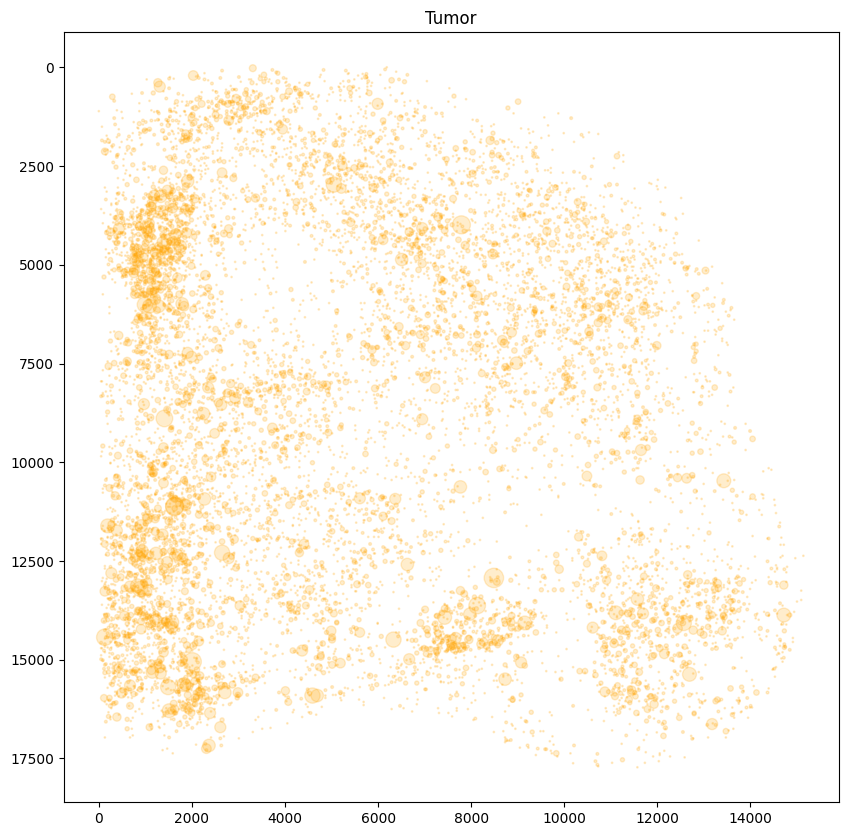

In [296]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
utils.plot_dot(tumor_data, "tdTomato", ax=ax)
ax.invert_yaxis()
ax.set_title("Tumor")

# Stiff Fibroblast

In [4]:
stiff_marker = ["Acta2", "Sfrp2", "Col1a1", "Lum", "Col5a1", "Inhba", "Postn", "Col6a3", "Igfbp5"]

In [5]:
fdata_ = fdata[fdata.obs["marker"] == "2-1"].copy()
cdata_ = cdata[cdata.obs["marker"] == "2-1"].copy()

In [6]:
cdata_ = utils.combine_guide_replicates(cdata_)

In [7]:
sc.tl.score_genes(fdata_, gene_list=stiff_marker, score_name="stiff_fibro_score")
fdata_.obs["stiff_fibro_mean"] = 0
for gene in stiff_marker:
    fdata_.obs["stiff_fibro_mean"] = np.array(fdata_.obs["stiff_fibro_mean"].tolist()) + np.array(fdata_[:, gene].X.toarray().flatten() / fdata_[:, gene].X.sum())

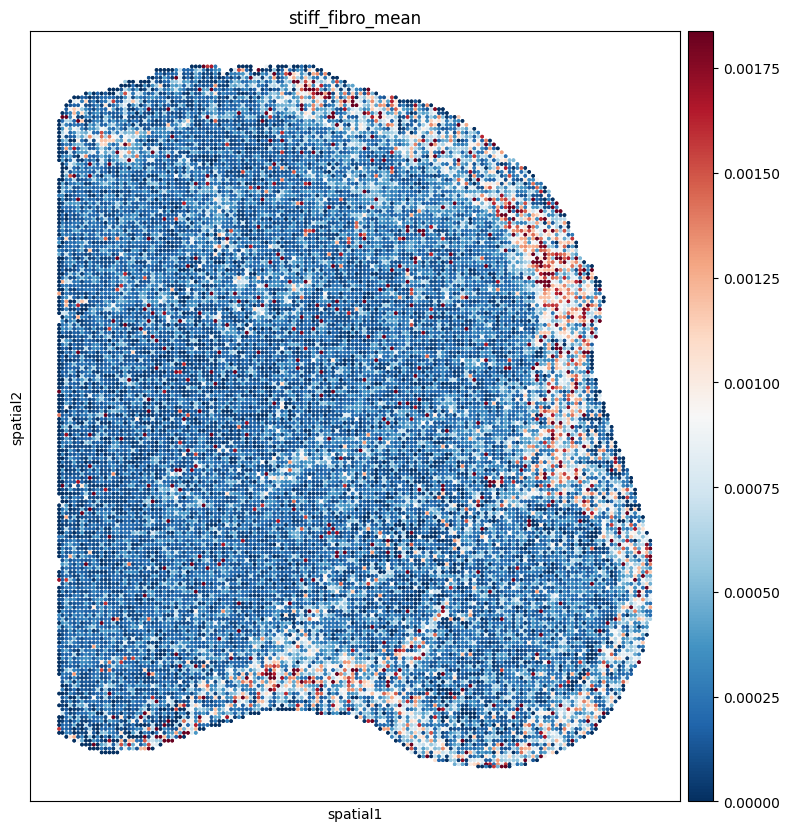

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sq.pl.spatial_scatter(fdata_, color="stiff_fibro_mean", shape=None, size=10, library_id="spatial", ax=ax, cmap='RdBu_r', vmax=np.quantile(fdata_.obs["stiff_fibro_mean"], 0.98))

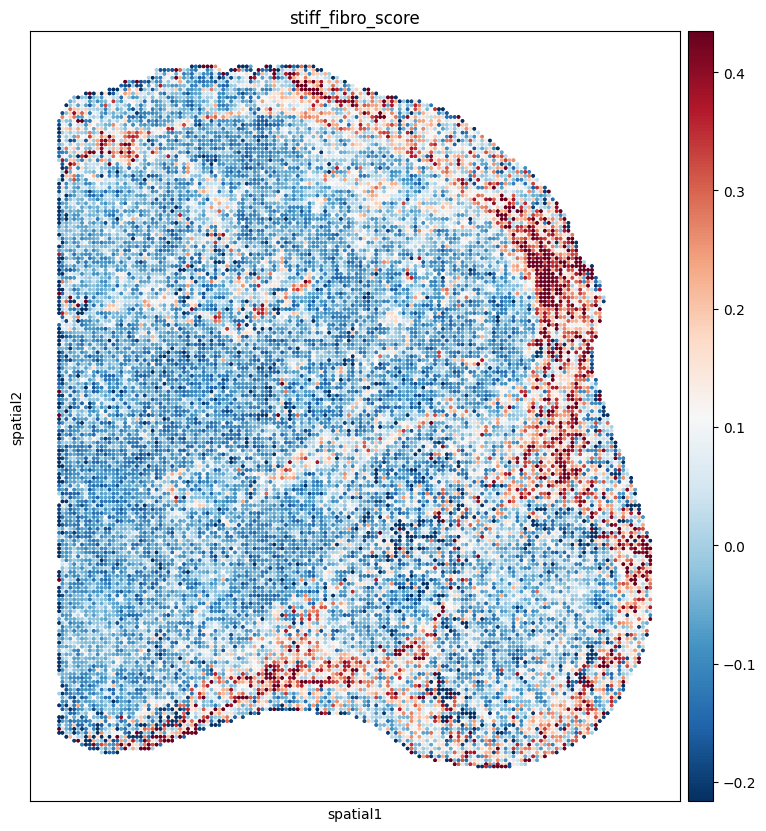

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sq.pl.spatial_scatter(fdata_, color="stiff_fibro_score", shape=None, size=10, library_id="spatial", ax=ax, cmap='RdBu_r',
    vmax=np.quantile(fdata_.obs["stiff_fibro_score"], 0.98),
    vmin=np.quantile(fdata_.obs["stiff_fibro_score"], 0.02))

/tmp/ipykernel_77621/1683954198.py:21: RuntimeWarning: divide by zero encountered in log10
  z = np.log10(coord_df_piv.values)


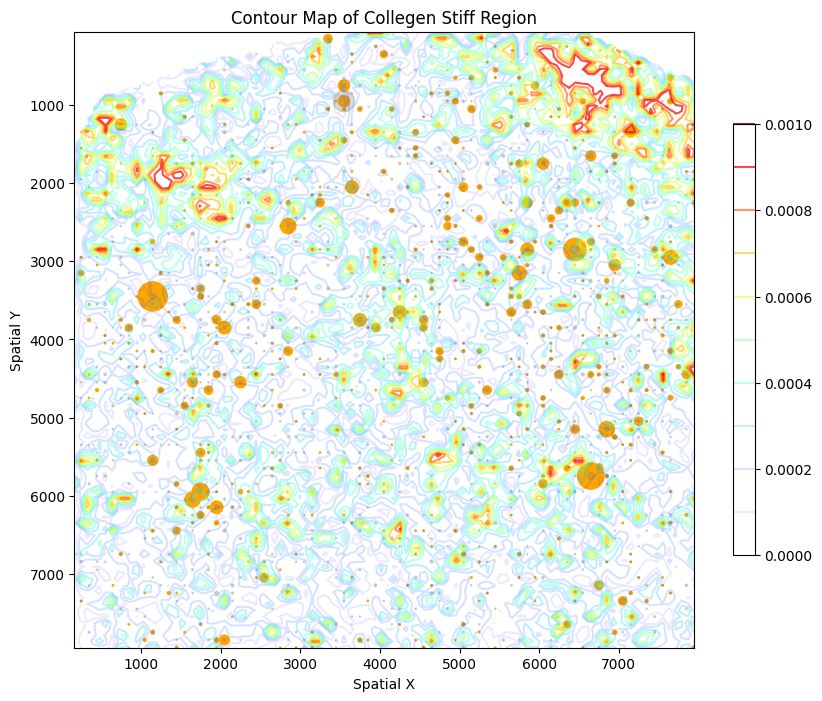

In [47]:
# Assuming plot_data is your AnnData object and apo_bin is the gene expression data
x_region = (0, 8000)
y_region = (0, 8000)

plot_data = utils.extract_region(fdata_, x_region, y_region)
apo_bin = plot_data.obs["stiff_fibro_mean"]
hypo_coord = plot_data.obsm['spatial']

# Create DataFrame with spatial coordinates and gene expression values
coord_df = pd.DataFrame({
    'x_coord': hypo_coord[:, 0],
    'y_coord': hypo_coord[:, 1],
    'value': apo_bin
})

# Remove points with no data (NaN)
coord_df = coord_df.dropna()

# Pivot table to create a grid
coord_df_piv = pd.pivot_table(coord_df, values="value", index="y_coord", columns="x_coord", aggfunc=np.mean)
z = np.log10(coord_df_piv.values)
y = coord_df_piv.index.values
x = coord_df_piv.columns.values

# Create a colormap
color_map = plt.get_cmap("jet")
new_cmap = mcolors.ListedColormap(color_map(np.linspace(0, 1, 100)))
new_cmap.colors[:, -1] = np.linspace(0, 0.8, new_cmap.N)

# Interpolation
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Flatten the x and y coordinates for griddata
points = np.array([coord_df['x_coord'].values, coord_df['y_coord'].values]).T

vmax = np.quantile(values, 0.95)
values = coord_df['value'].values
values = [vmax if v > vmax else v for v in values]
zi = griddata(points, values, (xi, yi), method='linear')

# Plot contour map
fig, ax = plt.subplots(figsize=(10, 8))
cs = ax.contour(xi, yi, zi, levels=10, cmap=new_cmap)
plt.colorbar(cs, ax=ax, shrink=0.7)

# colormap = cm.get_cmap("jet")
# colors = colormap(np.linspace(0, 1, len(plot_data.var_names)))
# for idx, guide in enumerate(plot_data.var_names):
#     utils.plot_dot(plot_data, guide, ax=ax, square=True, color=colors[idx])

utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgCd44", ax=ax, alpha=1)
utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgNTC", ax=ax, alpha=0.3, color="Grey", square=False)

plt.xlabel('Spatial X')
plt.ylabel('Spatial Y')
plt.title('Contour Map of Collegen Stiff Region')
plt.gca().invert_yaxis()
# plt.gca().invert_xaxis()
plt.show()

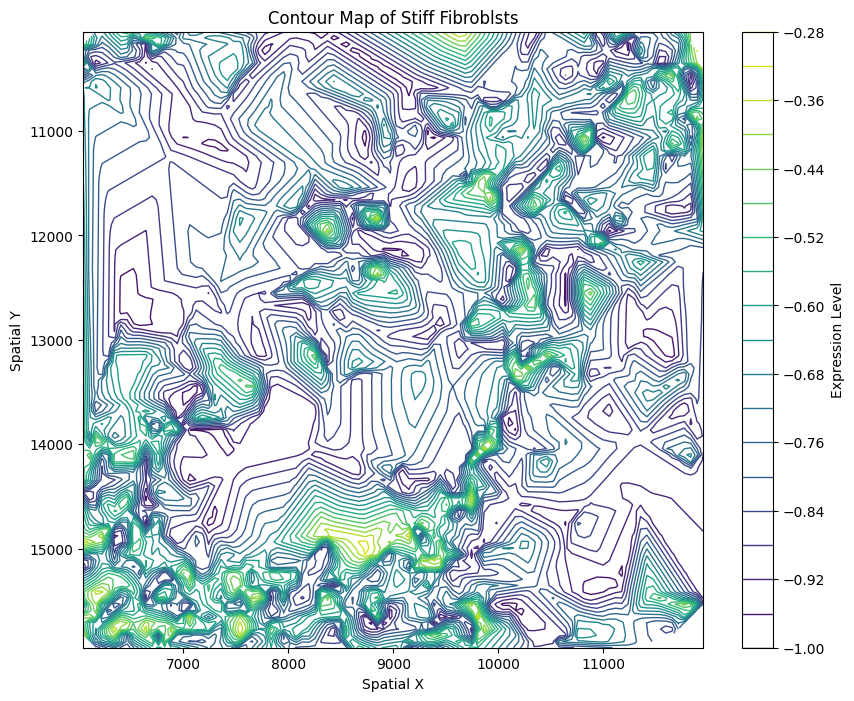

/tmp/ipykernel_47265/635185555.py:47: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap("jet")


In [76]:
# Extract spatial coordinates and gene expression values
x_region = (6000, 12000)
y_region = (10000, 16000)
plot_data = utils.extract_region(fdata_, x_region, y_region)
spatial_coords = plot_data.obsm['spatial']
gene_expression = plot_data.obs["stiff_fibro_score"].tolist()

# Create a DataFrame with spatial coordinates and gene expression
df = pd.DataFrame(spatial_coords, columns=['x', 'y'])
df['expression'] = gene_expression

# Filter out points with zero or near-zero expression values
threshold = 0.1  # You can adjust this threshold based on your data
df_filtered = df[df['expression'] > threshold]

# Create a grid of points for contour plotting
x = df_filtered['x']
y = df_filtered['y']
z = df_filtered['expression']
vmax = 0.5
z_ = np.array([vmax if z_ > vmax else z_ for z_ in z])
z = np.log10(z_ + 1e-9)

# Create grid values first.
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Interpolate over grid
from scipy.interpolate import griddata
zi = griddata((x, y), z, (xi, yi), method='linear')

# Plot contour map
plt.figure(figsize=(10, 8))
contour = plt.contour(xi, yi, zi, levels=20, linewidths=1, cmap="viridis")

# Add scatter plot of the filtered data points
#plt.scatter(df_filtered['x'], df_filtered['y'], c=df_filtered['expression'], cmap='viridis', s=1, alpha=0.7)

plt.title(f'Contour Map of Stiff Fibroblsts')
plt.xlabel('Spatial X')
plt.ylabel('Spatial Y')
plt.colorbar(label='Expression Level')
plt.gca().invert_yaxis()
plt.show()

colormap = cm.get_cmap("jet")
colors = colormap(np.linspace(0, 1, len(cdata_.var_names)))

# T

/tmp/ipykernel_77621/2129799556.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap("jet")


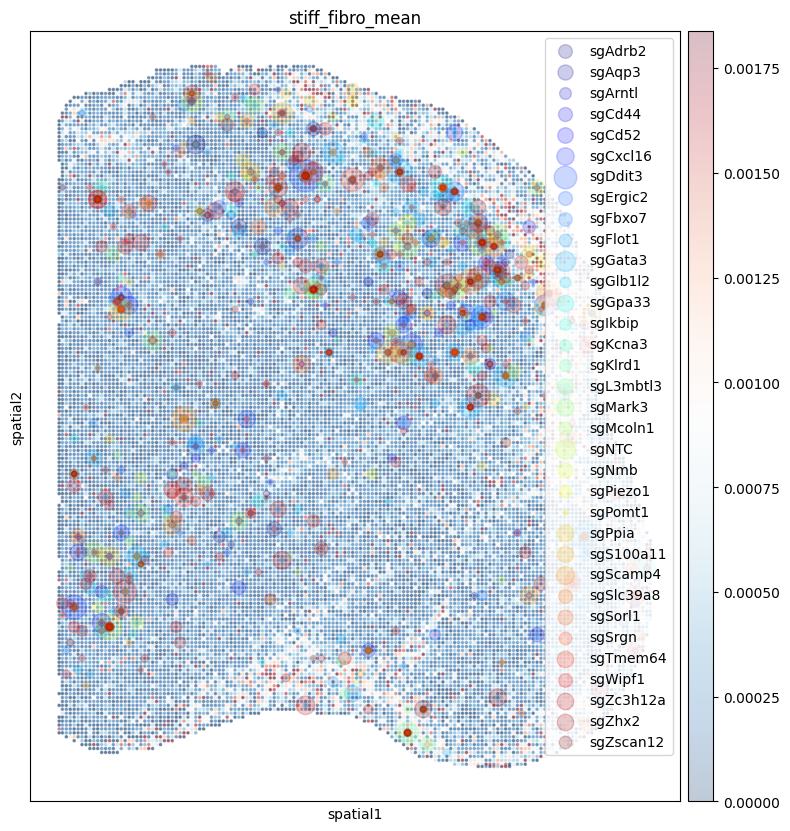

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sq.pl.spatial_scatter(fdata_,
    color="stiff_fibro_mean",
    shape=None,
    size=10,
    library_id="spatial",
    ax=ax,
    cmap='RdBu_r',
    vmax=np.quantile(fdata_.obs["stiff_fibro_mean"], 0.98),
    alpha=0.25)
colormap = cm.get_cmap("jet")
colors = colormap(np.linspace(0, 1, len(cdata_.var_names)))
for idx, guide in enumerate(cdata_.var_names):
    utils.plot_dot(cdata_[cdata_[:, guide].X.toarray() > 12], guide, ax=ax, square=False, color=colors[idx])
plt.legend()

# Exhaustion

In [10]:
t_marker = ['Cd8a','Cd8b1']
exhaustion_marker = ["Lag3", "Pdcd1", "Tigit", "Ctla4", 'Tox','Tnfrsf9','Tnfrsf18',  'Cxcr6', 'Cxcl13']

In [20]:
fdata_.var_names[fdata_.var_names.str.startswith('Cd8')]

Index(['Cd80', 'Cd81', 'Cd82', 'Cd83', 'Cd84', 'Cd86', 'Cd8a', 'Cd8b1'], dtype='object')

In [11]:
fdata_.obs["t_mean"] = 0
fdata_.obs["exhaustion_mean"] = 0
for gene in t_marker:
    fdata_.obs["t_mean"] = np.array(fdata_.obs["t_mean"].tolist()) + np.array(fdata_[:, gene].X.toarray().flatten() / fdata_[:, gene].X.sum())
for gene in exhaustion_marker:
    fdata_.obs["exhaustion_mean"] = np.array(fdata_.obs["exhaustion_mean"].tolist()) + np.array(fdata_[:, gene].X.toarray().flatten() / fdata_[:, gene].X.sum())

/tmp/ipykernel_77621/3653192565.py:53: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap("jet")


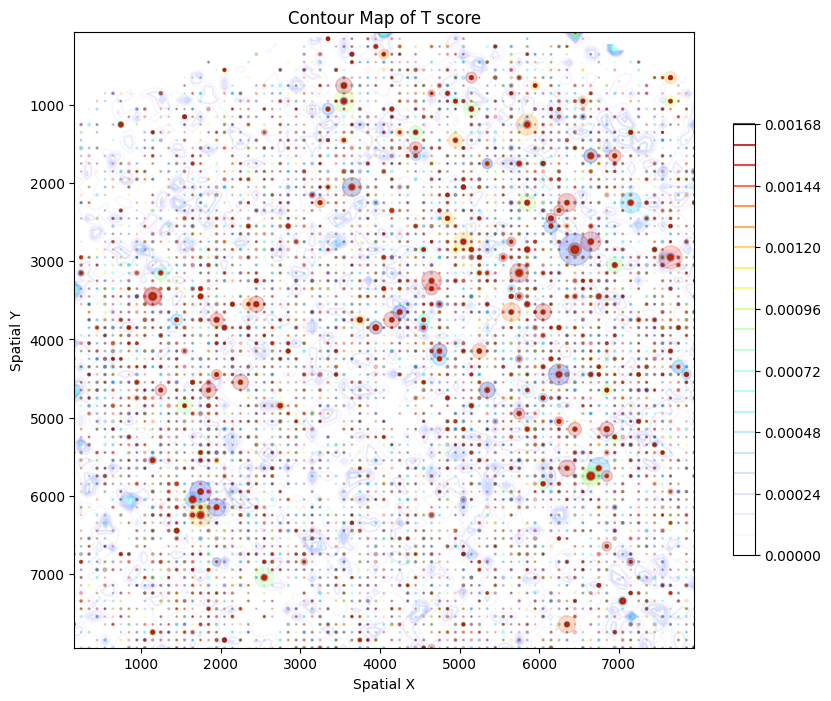

In [22]:
# Assuming plot_data is your AnnData object and apo_bin is the gene expression data
x_region = (0, 8000)
y_region = (0, 8000)

plot_data = utils.extract_region(fdata_, x_region, y_region)
apo_bin = plot_data.obs["t_mean"]
hypo_coord = plot_data.obsm['spatial']

# Create DataFrame with spatial coordinates and gene expression values
coord_df = pd.DataFrame({
    'x_coord': hypo_coord[:, 0],
    'y_coord': hypo_coord[:, 1],
    'value': apo_bin
})

# Remove points with no data (NaN)
coord_df = coord_df.dropna()

# Pivot table to create a grid
coord_df_piv = pd.pivot_table(coord_df, values="value", index="y_coord", columns="x_coord", aggfunc=np.mean)
z = coord_df_piv.values
y = coord_df_piv.index.values
x = coord_df_piv.columns.values

# Create a colormap
color_map = plt.get_cmap("jet")
new_cmap = mcolors.ListedColormap(color_map(np.linspace(0, 1, 100)))
new_cmap.colors[:, -1] = np.linspace(0, 0.8, new_cmap.N)

# Interpolation
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Flatten the x and y coordinates for griddata
points = np.array([coord_df['x_coord'].values, coord_df['y_coord'].values]).T
values = coord_df['value'].values
zi = griddata(points, values, (xi, yi), method='linear')

# Plot contour map
fig, ax = plt.subplots(figsize=(10, 8))
cs = ax.contour(xi, yi, zi, levels=20, cmap=new_cmap)
plt.colorbar(cs, ax=ax, shrink=0.7)

# colormap = cm.get_cmap("jet")
# colors = colormap(np.linspace(0, 1, len(plot_data.var_names)))
# for idx, guide in enumerate(plot_data.var_names):
#     utils.plot_dot(plot_data, guide, ax=ax, square=True, color=colors[idx])

# utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgCd44", ax=ax, alpha=1)
# utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgNTC", ax=ax, alpha=0.3, color="Grey")

colormap = cm.get_cmap("jet")
colors = colormap(np.linspace(0, 1, len(cdata_.var_names)))
for idx, guide in enumerate(cdata_.var_names):
    utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), guide, ax=ax, square=False, color=colors[idx])

plt.xlabel('Spatial X')
plt.ylabel('Spatial Y')
plt.title('Contour Map of T score')
#plt.legend()
plt.gca().invert_yaxis()
plt.show()
x_region = (0, 8000)
y_region = (0, 8000)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sq.pl.spatial_scatter(utils.extract_region(fdata_, x_region, y_region), color="t_mean", size=100, shape=None, cmap="Blues",ax=ax)

colormap = cm.get_cmap("jet")
colors = colormap(np.linspace(0, 1, len(cdata_.var_names)))
for idx, guide in enumerate(cdata_.var_names):
    utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), guide, ax=ax, square=False, color=colors[idx], alpha=0.1)

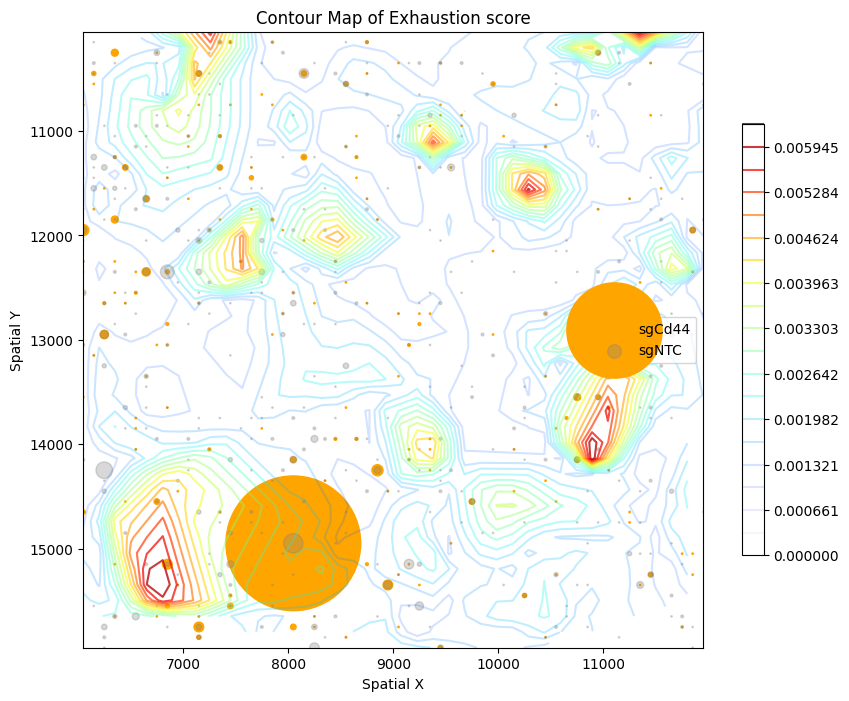

In [59]:
# Assuming plot_data is your AnnData object and apo_bin is the gene expression data
# x_region = (0, 12000)
# y_region = (0, 12000)

x_region = (6000, 12000)
y_region = (10000, 16000)

plot_data = utils.extract_region(fdata_, x_region, y_region)
apo_bin = plot_data.obs["exhaustion_mean"]
hypo_coord = plot_data.obsm['spatial']

# Create DataFrame with spatial coordinates and gene expression values
coord_df = pd.DataFrame({
    'x_coord': hypo_coord[:, 0],
    'y_coord': hypo_coord[:, 1],
    'value': apo_bin
})

# Remove points with no data (NaN)
coord_df = coord_df.dropna()

threshold = 1e-3
coord_df = coord_df[coord_df['value'] > threshold]

# Pivot table to create a grid
coord_df_piv = pd.pivot_table(coord_df, values="value", index="y_coord", columns="x_coord", aggfunc=np.mean)
y = coord_df_piv.index.values
x = coord_df_piv.columns.values

# Create a colormap
color_map = plt.get_cmap("jet")
new_cmap = mcolors.ListedColormap(color_map(np.linspace(0, 1, 100)))
new_cmap.colors[:, -1] = np.linspace(0, 0.8, new_cmap.N)

# Interpolation
xi = np.linspace(x.min(), x.max(), 40)
yi = np.linspace(y.min(), y.max(), 40)
xi, yi = np.meshgrid(xi, yi)

# Flatten the x and y coordinates for griddata
points = np.array([coord_df['x_coord'].values, coord_df['y_coord'].values]).T

values = coord_df['value'].values
vmax = np.quantile(values, 0.99)
values = [vmax if v > vmax else v for v in values]
zi = griddata(points, values, (xi, yi), method='linear')

# Plot contour map
fig, ax = plt.subplots(figsize=(10, 8))
levels = np.linspace(np.min(pd.DataFrame(zi).fillna(0)), np.max(pd.DataFrame(zi).fillna(0)), 20)
cs = ax.contour(xi, yi, zi, levels=levels, cmap=new_cmap)
plt.colorbar(cs, ax=ax, shrink=0.7)

# colormap = cm.get_cmap("jet")
# colors = colormap(np.linspace(0, 1, len(plot_data.var_names)))
# for idx, guide in enumerate(plot_data.var_names):
#     utils.plot_dot(plot_data, guide, ax=ax, square=True, color=colors[idx])

utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgCd44", ax=ax, alpha=1, square=True)
utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgNTC", ax=ax, alpha=0.3, color="Grey", square=True)

plt.xlabel('Spatial X')
plt.ylabel('Spatial Y')
plt.title('Contour Map of Exhaustion score')
plt.gca().invert_yaxis()
plt.legend()
plt.show()

In [25]:
fdata_, cdata_ = utils.align_rna_guide_data(fdata_, cdata_)

In [26]:
x_region = (0, 8000)
y_region = (0, 8000)

plot_data = utils.extract_region(fdata_, x_region, y_region)
plot_data_guide = utils.extract_region(cdata_, x_region, y_region)

p_cd44 = spearmanr(plot_data.obs["exhaustion_mean"], plot_data_guide[:, "sgCd44"].X.toarray())[0]
p_ntc = spearmanr(plot_data.obs["exhaustion_mean"], plot_data_guide[:, "sgNTC"].X.toarray())[0]
p_gata3 = spearmanr(plot_data.obs["exhaustion_mean"], plot_data_guide[:, "sgGata3"].X.toarray())[0]

In [27]:
t_data = plot_data[plot_data.obs["exhaustion_mean"] > plot_data.obs["exhaustion_mean"].quantile(0.95)]

In [28]:
t_data, g_data = utils.align_rna_guide_data(t_data, cdata_)

/home/wpy/stereoseq/20240502-SPACseq/bin/utils.py:126: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  rnadata.obs["cov"] = [str(marker) + '_' + str(array[0]) + "-" + str(array[1]) for marker, array in zip(rnadata.obs[marker_name], rnadata.obsm["spatial"])]


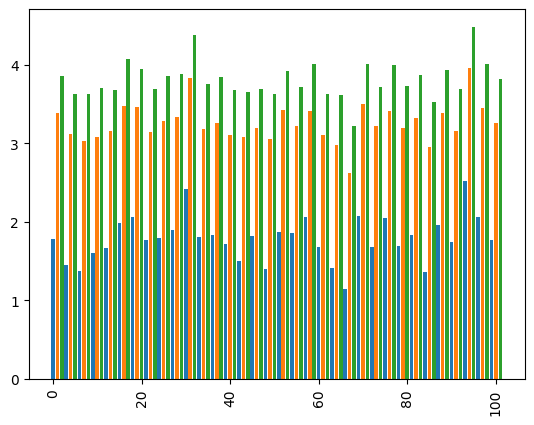

In [29]:
x = np.array([i for i in range(len(g_data.var_names))])
plt.bar(x * 3, np.log10(g_data.X.sum(axis=0)))
plt.bar(x * 3 + 1, np.log10(plot_data_guide.X.sum(axis=0)))
plt.bar(x * 3 + 2, np.log10(cdata_.X.sum(axis=0)))
plt.xticks(rotation=90)
plt.show()

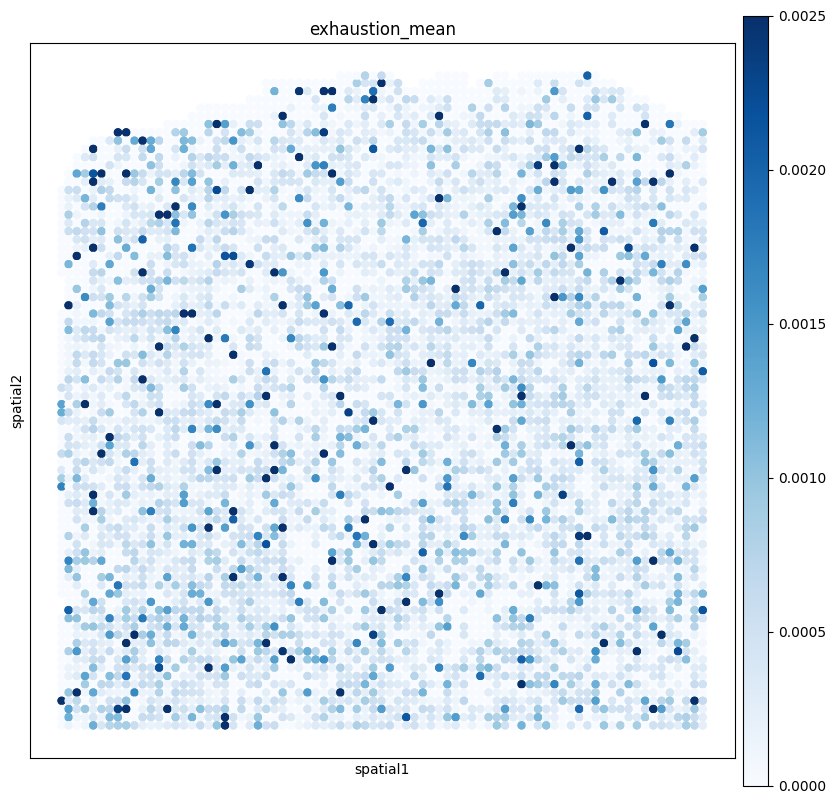

In [30]:
x_region = (0, 8000)
y_region = (0, 8000)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sq.pl.spatial_scatter(utils.extract_region(fdata_, x_region, y_region), color="exhaustion_mean", size=100, shape=None, cmap="Blues",ax=ax, vmax=0.0025)

# Basement Follicules

In [82]:
fdata_.var_names[fdata_.var_names.str.startswith('Col4')]

Index(['Col4a1', 'Col4a2', 'Col4a3', 'Col4a3bp', 'Col4a4', 'Col4a5', 'Col4a6'], dtype='object')

In [83]:
basement_marker = ['Col4a1', 'Col4a2', 'Col4a3', 'Col4a4', 'Col4a5', 'Col4a6',
    'Lama2', 'Lama3', 'Lama5', 'Lamb1', 'Lamb2', 'Lamb3', 'Lamc2']

In [84]:
sc.tl.score_genes(fdata_, gene_list=basement_marker, score_name="basement_score")
fdata_.obs["basement_mean"] = 0
for gene in basement_marker:
    fdata_.obs["basement_mean"] = np.array(fdata_.obs["basement_mean"].tolist()) + np.array(fdata_[:, gene].X.toarray().flatten() / fdata_[:, gene].X.sum())

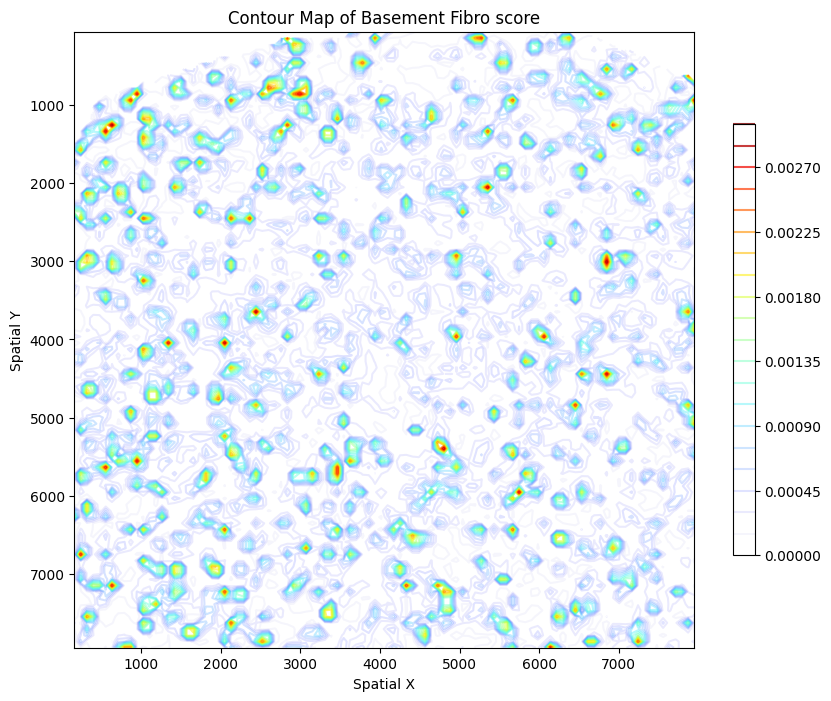

In [34]:
# Assuming plot_data is your AnnData object and apo_bin is the gene expression data
x_region = (0, 8000)
y_region = (0, 8000)

plot_data = utils.extract_region(fdata_, x_region, y_region)
apo_bin = plot_data.obs["basement_mean"]
hypo_coord = plot_data.obsm['spatial']

# Create DataFrame with spatial coordinates and gene expression values
coord_df = pd.DataFrame({
    'x_coord': hypo_coord[:, 0],
    'y_coord': hypo_coord[:, 1],
    'value': apo_bin
})

# Remove points with no data (NaN)
coord_df = coord_df.dropna()

# Pivot table to create a grid
coord_df_piv = pd.pivot_table(coord_df, values="value", index="y_coord", columns="x_coord", aggfunc=np.mean)
y = coord_df_piv.index.values
x = coord_df_piv.columns.values

# Create a colormap
color_map = plt.get_cmap("jet")
new_cmap = mcolors.ListedColormap(color_map(np.linspace(0, 1, 100)))
new_cmap.colors[:, -1] = np.linspace(0, 0.8, new_cmap.N)

# Interpolation
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Flatten the x and y coordinates for griddata
points = np.array([coord_df['x_coord'].values, coord_df['y_coord'].values]).T
values = coord_df['value'].values
vmax = np.quantile(values, 0.98)
values = [vmax if v > vmax else v for v in values]
zi = griddata(points, values, (xi, yi), method='linear')

# Plot contour map
fig, ax = plt.subplots(figsize=(10, 8))
cs = ax.contour(xi, yi, zi, levels=20, cmap=new_cmap)
plt.colorbar(cs, ax=ax, shrink=0.7)

# colormap = cm.get_cmap("jet")
# colors = colormap(np.linspace(0, 1, len(plot_data.var_names)))
# for idx, guide in enumerate(plot_data.var_names):
#     utils.plot_dot(plot_data, guide, ax=ax, square=True, color=colors[idx])

#utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgCd44", ax=ax, alpha=1)
#utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgNTC", ax=ax, alpha=0.3, color="Grey")

plt.xlabel('Spatial X')
plt.ylabel('Spatial Y')
plt.title('Contour Map of Basement Fibro score')
plt.gca().invert_yaxis()
plt.show()

# Break down of basement

In [35]:
fdata_.var_names[fdata_.var_names.str.startswith('Yap')]

Index(['Yap1'], dtype='object')

In [24]:
basement_breakdown_markers = ["Mmp9", "Adam8", "Adam9", "Adam12", "Adam15"]

In [25]:
sc.tl.score_genes(fdata_, gene_list=basement_breakdown_markers, score_name="basement_breakdown_score")
fdata_.obs["basement_breakdown_mean"] = 0
for gene in basement_breakdown_markers:
    fdata_.obs["basement_breakdown_mean"] = np.array(fdata_.obs["basement_breakdown_mean"].tolist()) + np.array(fdata_[:, gene].X.toarray().flatten() / fdata_[:, gene].X.sum())

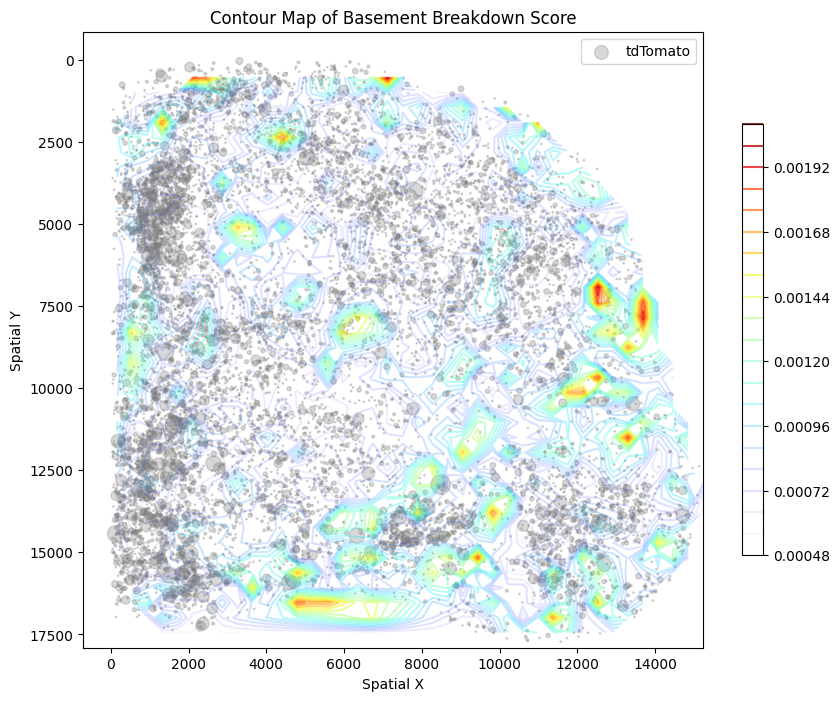

In [49]:
# Assuming plot_data is your AnnData object and apo_bin is the gene expression data
# x_region = (2000, 8000)
# y_region = (2000, 8000)
x_region = (0, 30000)
y_region = (0, 30000)

plot_data = utils.extract_region(fdata_, x_region, y_region)
apo_bin = plot_data.obs["basement_breakdown_mean"]
hypo_coord = plot_data.obsm['spatial']

# Create DataFrame with spatial coordinates and gene expression values
coord_df = pd.DataFrame({
    'x_coord': hypo_coord[:, 0],
    'y_coord': hypo_coord[:, 1],
    'value': apo_bin
})

# Remove points with no data (NaN)
coord_df = coord_df.dropna()

coord_df = coord_df[coord_df['value'] > 0.0005]

# Pivot table to create a grid
coord_df_piv = pd.pivot_table(coord_df, values="value", index="y_coord", columns="x_coord", aggfunc=np.mean)
y = coord_df_piv.index.values
x = coord_df_piv.columns.values

# Create a colormap
color_map = plt.get_cmap("jet")
new_cmap = mcolors.ListedColormap(color_map(np.linspace(0, 1, 100)))
new_cmap.colors[:, -1] = np.linspace(0, 0.8, new_cmap.N)

# Interpolation
xi = np.linspace(x.min(), x.max(), 40)
yi = np.linspace(y.min(), y.max(), 40)
xi, yi = np.meshgrid(xi, yi)

# Flatten the x and y coordinates for griddata
points = np.array([coord_df['x_coord'].values, coord_df['y_coord'].values]).T
values = coord_df['value'].values
vmax = np.quantile(values, 0.98)
values = [vmax if v > vmax else v for v in values]
zi = griddata(points, values, (xi, yi), method='linear')

# Plot contour map
fig, ax = plt.subplots(figsize=(10, 8))
cs = ax.contour(xi, yi, zi, levels=20, cmap=new_cmap)
plt.colorbar(cs, ax=ax, shrink=0.7)

# colormap = cm.get_cmap("jet")
# colors = colormap(np.linspace(0, 1, len(plot_data.var_names)))
# for idx, guide in enumerate(plot_data.var_names):
#     utils.plot_dot(plot_data, guide, ax=ax, square=True, color=colors[idx])

#utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgCd44", ax=ax, alpha=1)
utils.plot_dot(utils.extract_region(tumor_data, x_region, y_region), "tdTomato", ax=ax, alpha=0.3, color="Grey")

plt.xlabel('Spatial X')
plt.ylabel('Spatial Y')
plt.title('Contour Map of Basement Breakdown Score')
plt.legend()
plt.gca().invert_yaxis()
plt.show()

# Mechanical Stimulus

In [39]:
fdata_.var_names[fdata_.var_names.str.startswith('Yap')]

Index(['Yap1'], dtype='object')

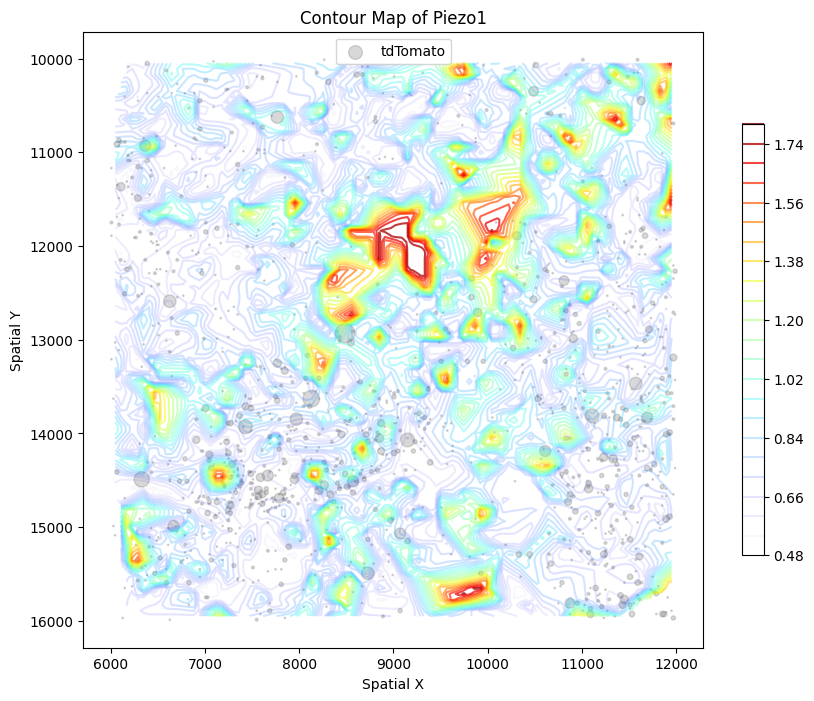

In [60]:
# Assuming plot_data is your AnnData object and apo_bin is the gene expression data
x_region = (6000, 12000)
y_region = (10000, 16000)
# x_region = (0, 30000)
# y_region = (0, 30000)

plot_data = utils.extract_region(fdata_, x_region, y_region)
apo_bin = plot_data[:, "Piezo1"].X.toarray().flatten()
hypo_coord = plot_data.obsm['spatial']

# Create DataFrame with spatial coordinates and gene expression values
coord_df = pd.DataFrame({
    'x_coord': hypo_coord[:, 0],
    'y_coord': hypo_coord[:, 1],
    'value': apo_bin
})

# Remove points with no data (NaN)
coord_df = coord_df.dropna()

coord_df = coord_df[coord_df['value'] > 0.5]

# Pivot table to create a grid
coord_df_piv = pd.pivot_table(coord_df, values="value", index="y_coord", columns="x_coord", aggfunc=np.mean)
y = coord_df_piv.index.values
x = coord_df_piv.columns.values

# Create a colormap
color_map = plt.get_cmap("jet")
new_cmap = mcolors.ListedColormap(color_map(np.linspace(0, 1, 100)))
new_cmap.colors[:, -1] = np.linspace(0, 0.8, new_cmap.N)

# Interpolation
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Flatten the x and y coordinates for griddata
points = np.array([coord_df['x_coord'].values, coord_df['y_coord'].values]).T
values = coord_df['value'].values
vmax = np.quantile(values, 0.98)
values = [vmax if v > vmax else v for v in values]
zi = griddata(points, values, (xi, yi), method='linear')

# Plot contour map
fig, ax = plt.subplots(figsize=(10, 8))
levels = np.linspace(z.min(), z.max(), 20)
cs = ax.contour(xi, yi, zi, levels=20, cmap=new_cmap)
plt.colorbar(cs, ax=ax, shrink=0.7)

# colormap = cm.get_cmap("jet")
# colors = colormap(np.linspace(0, 1, len(plot_data.var_names)))
# for idx, guide in enumerate(plot_data.var_names):
#     utils.plot_dot(plot_data, guide, ax=ax, square=True, color=colors[idx])

#utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgCd44", ax=ax, alpha=1)
utils.plot_dot(utils.extract_region(tumor_data, x_region, y_region), "tdTomato", ax=ax, alpha=0.3, color="Grey")

plt.xlabel('Spatial X')
plt.ylabel('Spatial Y')
plt.title('Contour Map of Piezo1')
plt.legend()
plt.gca().invert_yaxis()
plt.show()

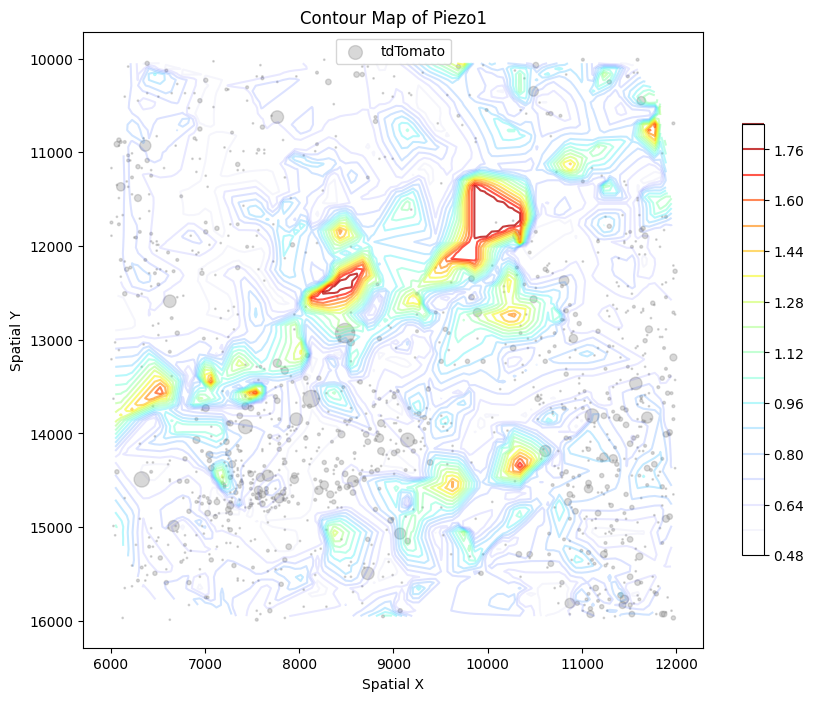

In [61]:
# Assuming plot_data is your AnnData object and apo_bin is the gene expression data
x_region = (6000, 12000)
y_region = (10000, 16000)
# x_region = (0, 30000)
# y_region = (0, 30000)

plot_data = utils.extract_region(fdata_, x_region, y_region)
apo_bin = plot_data[:, "Yap1"].X.toarray().flatten()
hypo_coord = plot_data.obsm['spatial']

# Create DataFrame with spatial coordinates and gene expression values
coord_df = pd.DataFrame({
    'x_coord': hypo_coord[:, 0],
    'y_coord': hypo_coord[:, 1],
    'value': apo_bin
})

# Remove points with no data (NaN)
coord_df = coord_df.dropna()

coord_df = coord_df[coord_df['value'] > 0.5]

# Pivot table to create a grid
coord_df_piv = pd.pivot_table(coord_df, values="value", index="y_coord", columns="x_coord", aggfunc=np.mean)
y = coord_df_piv.index.values
x = coord_df_piv.columns.values

# Create a colormap
color_map = plt.get_cmap("jet")
new_cmap = mcolors.ListedColormap(color_map(np.linspace(0, 1, 100)))
new_cmap.colors[:, -1] = np.linspace(0, 0.8, new_cmap.N)

# Interpolation
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Flatten the x and y coordinates for griddata
points = np.array([coord_df['x_coord'].values, coord_df['y_coord'].values]).T
values = coord_df['value'].values
vmax = np.quantile(values, 0.98)
values = [vmax if v > vmax else v for v in values]
zi = griddata(points, values, (xi, yi), method='linear')

# Plot contour map
fig, ax = plt.subplots(figsize=(10, 8))
levels = np.linspace(z.min(), z.max(), 20)
cs = ax.contour(xi, yi, zi, levels=20, cmap=new_cmap)
plt.colorbar(cs, ax=ax, shrink=0.7)

# colormap = cm.get_cmap("jet")
# colors = colormap(np.linspace(0, 1, len(plot_data.var_names)))
# for idx, guide in enumerate(plot_data.var_names):
#     utils.plot_dot(plot_data, guide, ax=ax, square=True, color=colors[idx])

#utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgCd44", ax=ax, alpha=1)
utils.plot_dot(utils.extract_region(tumor_data, x_region, y_region), "tdTomato", ax=ax, alpha=0.3, color="Grey")

plt.xlabel('Spatial X')
plt.ylabel('Spatial Y')
plt.title('Contour Map of Piezo1')
plt.legend()
plt.gca().invert_yaxis()
plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


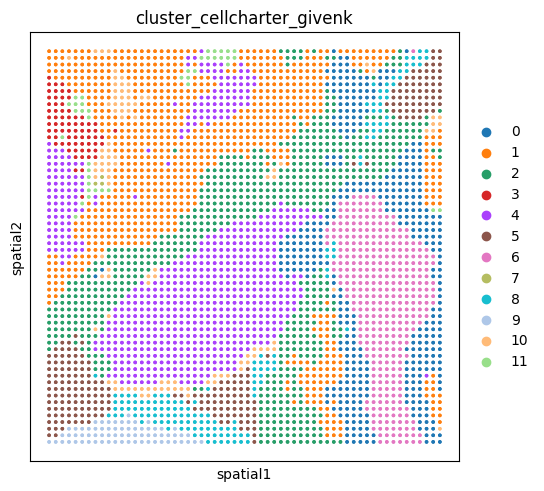

In [62]:
sq.pl.spatial_scatter(plot_data, color="cluster_cellcharter_givenk", shape=None, size=10, library_id="spatial")

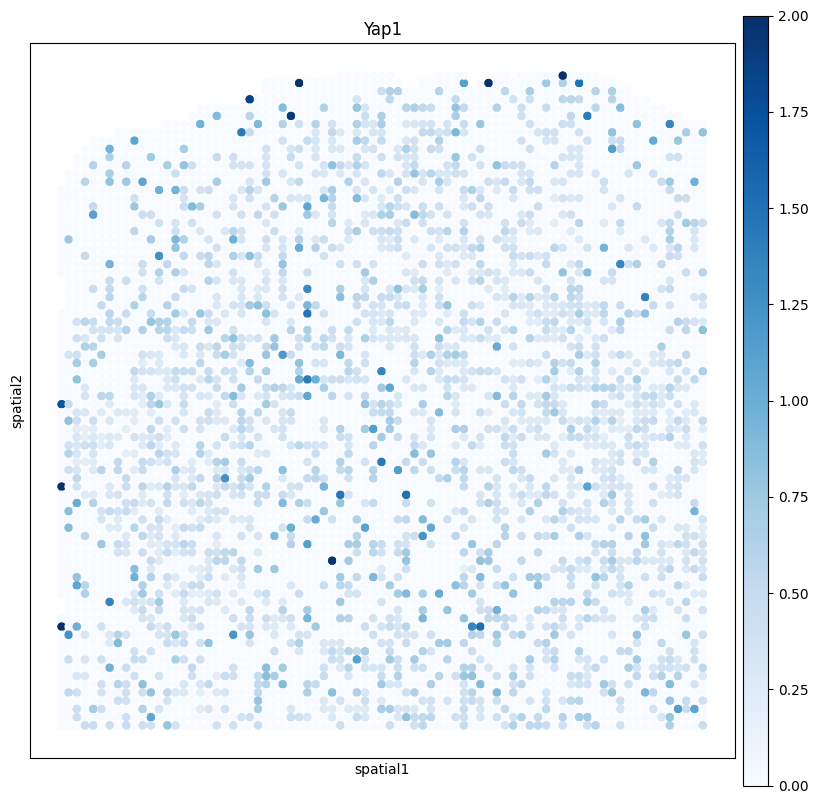

In [42]:
x_region = (0, 8000)
y_region = (0, 8000)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sq.pl.spatial_scatter(utils.extract_region(fdata_, x_region, y_region), color="Yap1", size=100, shape=None, cmap="Blues",ax=ax, vmax=2)

In [86]:
# breakdown of basement ~ collegen reform
x_region = (6000, 12000)
y_region = (10000, 16000)
c_data = utils.extract_region(fdata_, x_region, y_region)
c_data

AnnData object with n_obs × n_vars = 3600 × 13177
    obs: 'marker', 'n_genes', 'n_counts', '_scvi_batch', '_scvi_labels', 'cluster_cellcharter_givenk', 'stiff_fibro_score', 'stiff_fibro_mean', 't_mean', 'exhaustion_mean', 'basement_breakdown_score', 'basement_breakdown_mean', 'basement_score', 'basement_mean'
    var: 'mt', 'mt-', 'gm', 'Rb', 'rik'
    uns: '_cellcharter', '_scvi_manager_uuid', '_scvi_uuid', 'cluster_cellcharter_givenk_colors', 'log1p', 'rank_genes_groups', 'spatial_neighbors'
    obsm: 'X_cellcharter', 'X_scVI', 'spatial'
    layers: 'counts'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [64]:
annotation = sc.read_h5ad("./RNA/Multitime.annotation.sort.h5")

In [65]:
annot_data = utils.extract_small_bin(annotation, c_data)

In [66]:
annot_data = annot_data[annot_data.obs["annotations"].str.endswith("T") & (annot_data.obs["annotations"] != "Unknown T")]

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


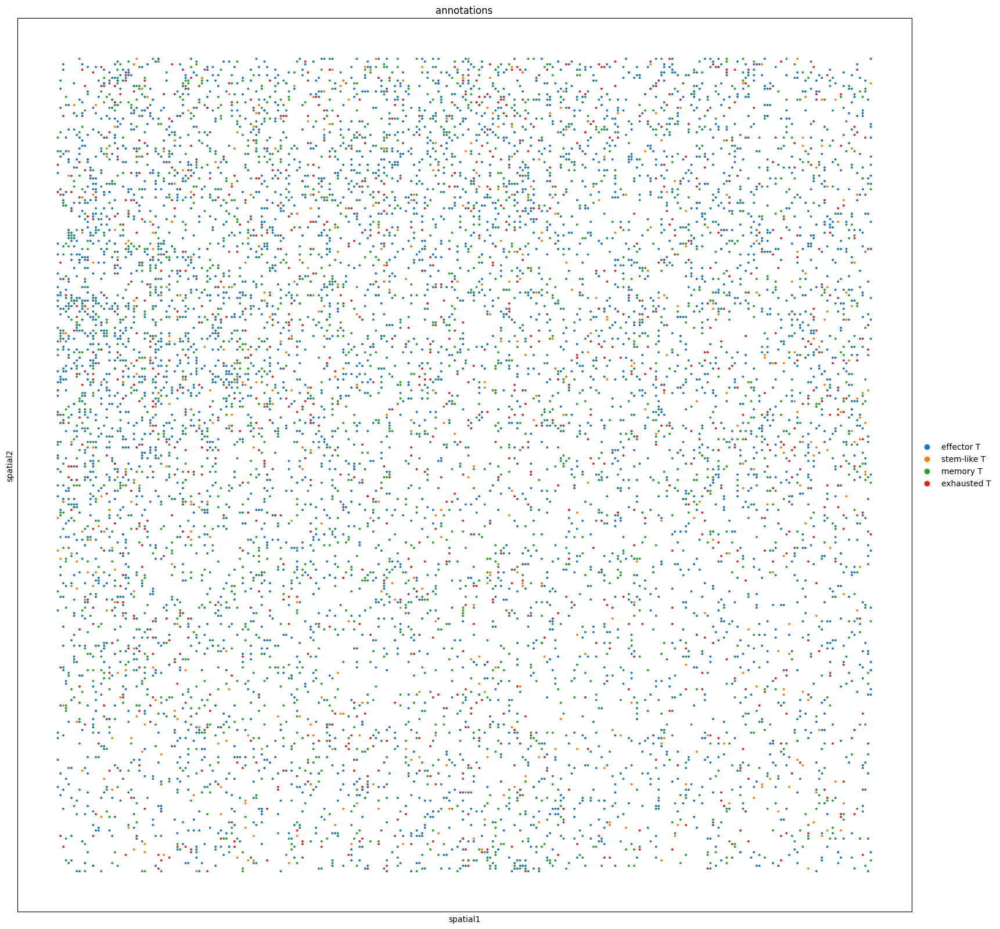

In [67]:
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
sq.pl.spatial_scatter(annot_data, color="annotations", shape=None, size=10, library_id="spatial", ax=ax)

In [87]:
# breakdown of basement ~ collegen reform
x_region = (6000, 12000)
y_region = (10000, 16000)
c_data = utils.extract_region(fdata_, x_region, y_region)
c_data

AnnData object with n_obs × n_vars = 3600 × 13177
    obs: 'marker', 'n_genes', 'n_counts', '_scvi_batch', '_scvi_labels', 'cluster_cellcharter_givenk', 'stiff_fibro_score', 'stiff_fibro_mean', 't_mean', 'exhaustion_mean', 'basement_breakdown_score', 'basement_breakdown_mean', 'basement_score', 'basement_mean'
    var: 'mt', 'mt-', 'gm', 'Rb', 'rik'
    uns: '_cellcharter', '_scvi_manager_uuid', '_scvi_uuid', 'cluster_cellcharter_givenk_colors', 'log1p', 'rank_genes_groups', 'spatial_neighbors'
    obsm: 'X_cellcharter', 'X_scVI', 'spatial'
    layers: 'counts'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [89]:
g_data = utils.extract_region(cdata_, x_region, y_region)

In [82]:
c_data

AnnData object with n_obs × n_vars = 2500 × 13177
    obs: 'marker', 'n_genes', 'n_counts', '_scvi_batch', '_scvi_labels', 'cluster_cellcharter_givenk', 'stiff_fibro_score', 'stiff_fibro_mean', 't_mean', 'exhaustion_mean', 'cov', 'basement_score', 'basement_mean', 'basement_breakdown_score', 'basement_breakdown_mean'
    var: 'mt', 'mt-', 'gm', 'Rb', 'rik'
    uns: '_cellcharter', '_scvi_manager_uuid', '_scvi_uuid', 'cluster_cellcharter_givenk_colors', 'log1p', 'rank_genes_groups', 'spatial_neighbors'
    obsm: 'X_cellcharter', 'X_scVI', 'spatial'
    layers: 'counts'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [90]:
r_dict = {}
for guide in g_data.var_names:
    r_dict[guide] = spearmanr(g_data[:, guide].X.flatten(), c_data.obs["exhaustion_mean"].tolist())[0]
r_df = pd.DataFrame(r_dict, index=['r']).T

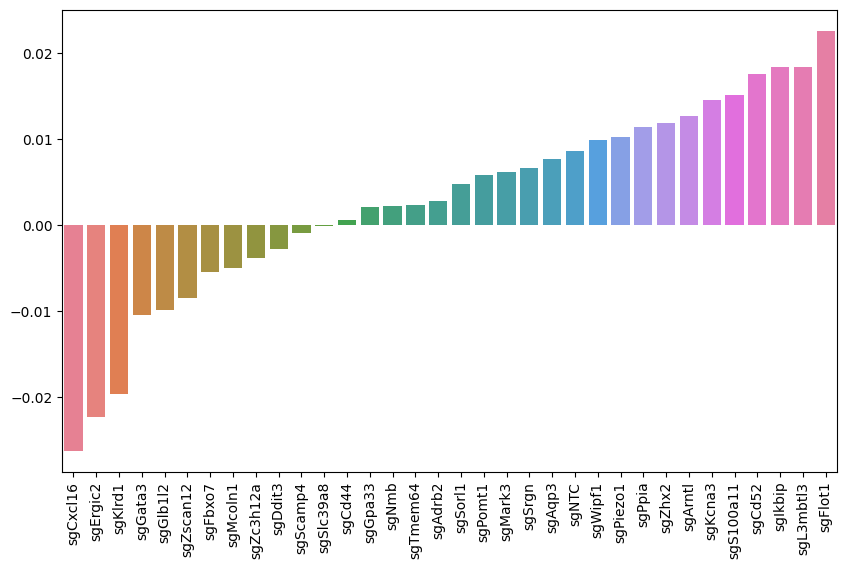

In [91]:
plt.figure(figsize=(10, 6))
sns.barplot(r_df.sort_values(by="r").T)
plt.xticks(rotation=90)
plt.show()

In [92]:
def cal_min_distance_to_border(adata, bin):
    bin_coords = bin.obsm["spatial"][0]

    low_region_coords = adata[adata.obs["collegen"] == 'low'].obsm["spatial"]
    distances = np.sqrt(np.sum((low_region_coords - bin_coords) ** 2, axis=1))

    return np.min(distances)

Text(0.5, 1.0, 'Log Distribution of Fibroblasts Stiff Signature')

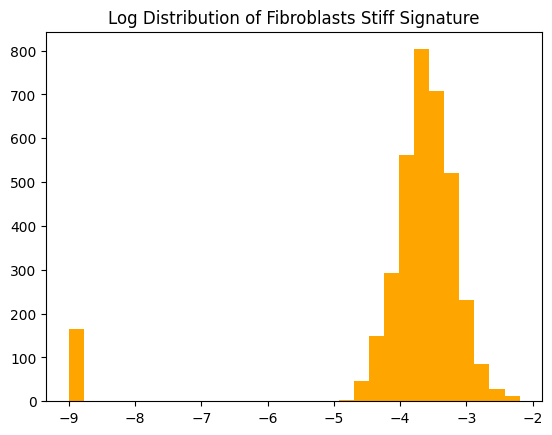

In [93]:
plt.hist(np.log10(c_data.obs["stiff_fibro_mean"] + 1e-9), color="Orange", bins=30)
plt.title("Log Distribution of Fibroblasts Stiff Signature")

In [98]:
c_data.obs["stiff"] = 0
threshold = 0.6
c_data.obs["stiff"][c_data.obs["stiff_fibro_mean"] > np.quantile(c_data.obs["stiff_fibro_mean"], threshold)] = "stiff"
c_data.obs["stiff"][c_data.obs["stiff_fibro_mean"] <= np.quantile(c_data.obs["stiff_fibro_mean"], threshold)] = "not_stiff"

/tmp/ipykernel_47265/2897017719.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c_data.obs["stiff"][c_data.obs["stiff_fibro_mean"] > np.quantile(c_data.obs["stiff_fibro_mean"], threshold)] = "stiff"


/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


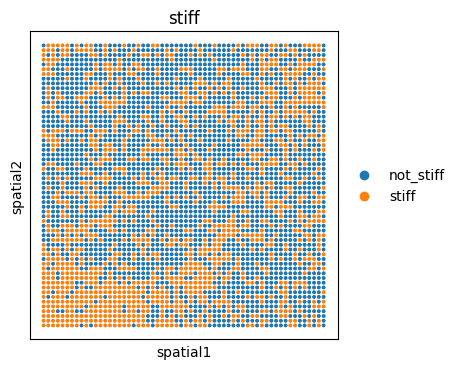

In [99]:
fig, ax = plt.subplots(1, 1, figsize=(4, 4))
sq.pl.spatial_scatter(c_data, color="stiff", shape=None, size=10, library_id="spatial", ax=ax)

In [100]:
p_df = c_data.obs[["stiff", "t_mean", "exhaustion_mean", "basement_mean", "basement_breakdown_mean"]]

/tmp/ipykernel_47265/1179713793.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['stiff'] = df['stiff'].astype('category')
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


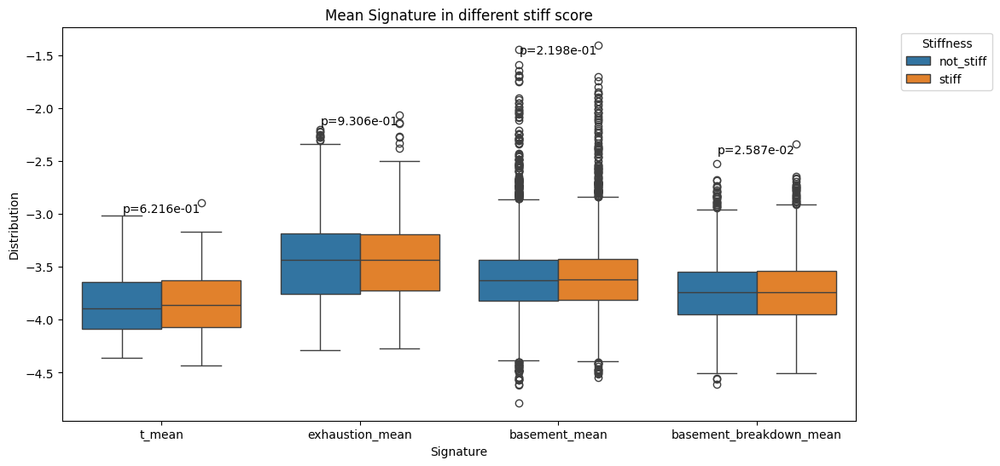

In [101]:
df = p_df

# 将 'stiff' 列转换为类别型数据
df['stiff'] = df['stiff'].astype('category')

# 将数据转换成长格式
df_long = pd.melt(df, id_vars=['stiff'], var_name='mean_type', value_name='value')

# 计算显著性并进行标注
mean_types = df_long['mean_type'].unique()
significance_annotations = []

for mean_type in mean_types:
    stiff_values = df_long[(df_long['mean_type'] == mean_type) & (df_long['stiff'] == 'stiff')]['value']
    not_stiff_values = df_long[(df_long['mean_type'] == mean_type) & (df_long['stiff'] == 'not_stiff')]['value']
    
    # 进行方差分析 (ANOVA)
    stat, p_value = f_oneway(stiff_values, not_stiff_values)
    
    # 添加显著性标注
    #if p_value < 0.05:
    significance_annotations.append((mean_type, p_value))

# 创建绘图
plt.figure(figsize=(12, 6))
df_long["value"] = np.log10(df_long["value"])

# 使用 Seaborn 绘制箱型图
sns.boxplot(x='mean_type', y='value', hue='stiff', data=df_long)

# 添加显著性标注
for mean_type, p_value in significance_annotations:
    x = mean_types.tolist().index(mean_type)
    y = df_long[df_long['mean_type'] == mean_type]['value'].max()
    plt.text(x, y, f'p={p_value:.3e}', ha='center', va='top', color='black')

# 设置图表标题和标签
plt.title('Mean Signature in different stiff score')
plt.xlabel('Signature')
plt.ylabel('Distribution')

# 调整图例位置
plt.legend(title='Stiffness', bbox_to_anchor=(1.05, 1), loc='upper left')

# 显示图表
plt.show()

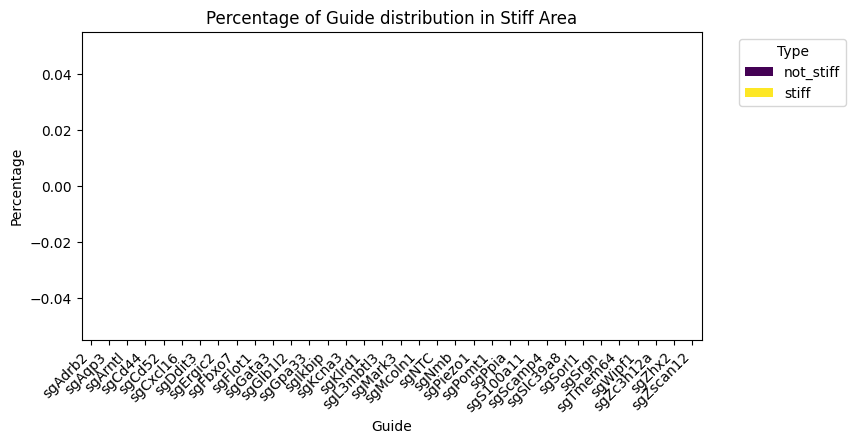

In [102]:
p_df = pd.concat([pd.DataFrame(g_data.X, columns=g_data.var_names, index=g_data.obs_names), pd.DataFrame(c_data.obs.stiff)], axis=1)
p_df = p_df.groupby("stiff").sum()# / p_df.iloc[:, :-1].sum(axis=0)
# 创建绘图
fig, ax = plt.subplots(figsize=(8, 4))

p_df = p_df.T.sort_values(by="stiff")

# 绘制百分比堆叠条形图
p_df.plot(kind='bar', stacked=True, ax=ax, colormap='viridis')

# 设置图表标题和标签
plt.title('Percentage of Guide distribution in Stiff Area')
plt.xlabel('Guide')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')

# 添加图例
plt.legend(title='Type', bbox_to_anchor=(1.05, 1), loc='upper left')

# 显示图表
plt.show()

In [103]:
name_map = pd.DataFrame(g_data.var_names).to_dict()[0]
g_data.obs["guide"] = g_data.X.argmax(axis=1)
g_data.obs["guide"] = g_data.obs["guide"].map(lambda x: name_map[x])
g_data.obs["guide"][g_data.X.max(axis=1) == 0] = "None"

/tmp/ipykernel_47265/4106391319.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  g_data.obs["guide"][g_data.X.max(axis=1) == 0] = "None"


In [104]:
c_data.obs

,marker,n_genes,n_counts,_scvi_batch,_scvi_labels,cluster_cellcharter_givenk,stiff_fibro_score,stiff_fibro_mean,t_mean,exhaustion_mean,basement_breakdown_score,basement_breakdown_mean,basement_score,basement_mean,stiff
12524-1,2-1,2203,5626,2,0,1,-0.019174,0.000205,0.000000,0.000498,-0.056897,0.000155,0.128963,0.000335,not_stiff
20264-1,2-1,1198,2447,2,0,0,-0.137005,0.000040,0.000343,0.000471,-0.108664,0.000078,0.043113,0.000210,not_stiff
14145-1,2-1,1801,3809,2,0,1,0.012044,0.000262,0.000131,0.000353,-0.072786,0.000107,0.014088,0.000293,not_stiff
18645-1,2-1,956,1780,2,0,0,-0.121123,0.000051,0.000000,0.000000,-0.278042,0.000000,0.019644,0.000188,not_stiff
16309-1,2-1,1975,4405,2,0,4,-0.044030,0.000187,0.000000,0.000106,-0.050965,0.000119,0.130685,0.000833,not_stiff
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17799-1,2-1,239,342,2,0,2,-0.205772,0.000000,0.000000,0.000000,-0.319967,0.000000,0.213159,0.000360,not_stiff
12916-1,2-1,598,939,2,0,2,-0.236026,0.000000,0.000000,0.000607,-0.273523,0.000000,0.258091,0.000536,not_stiff
17438-1,2-1,245,338,2,0,2,-0.263868,0.000000,0.000000,0.000000,-0.312169,0.000000,0.125487,0.000568,not_stiff
15606-1,2-1,448,652,2,0,2,0.258626,0.000364,0.000000,0.000000,-0.265814,0.000000,-0.120175,0.000000,stiff


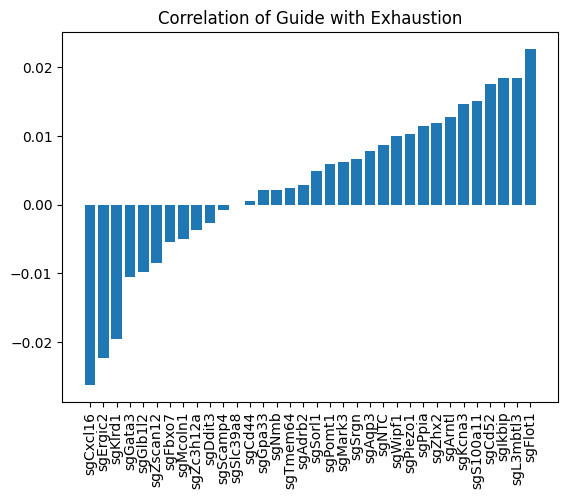

In [105]:
r_dict = {}
for guide in g_data.var_names:
    r_dict[guide] = spearmanr(g_data[:, guide].X, c_data.obs["exhaustion_mean"])[0]
    #print(r_dict)
r_df = pd.DataFrame(r_dict, index=['r'])
r_df = r_df.T.sort_values(by="r")
plt.title("Correlation of Guide with Exhaustion")
plt.bar(r_df.index, r_df.r)
plt.xticks(rotation=90)
plt.show()

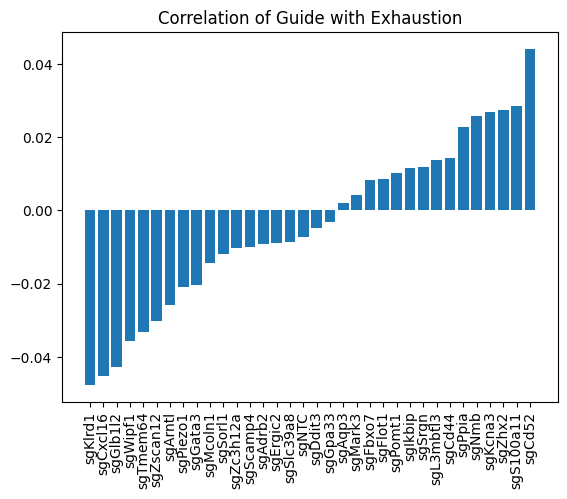

In [106]:
r_dict = {}
for guide in g_data.var_names:
    r_dict[guide] = spearmanr(g_data[c_data.obs["stiff"] == "stiff"][:, guide].X, c_data[c_data.obs["stiff"] == "stiff"].obs["exhaustion_mean"])[0]
    #print(r_dict)
r_df = pd.DataFrame(r_dict, index=['r'])
r_df = r_df.T.sort_values(by="r")
plt.title("Correlation of Guide with Exhaustion")
plt.bar(r_df.index, r_df.r)
plt.xticks(rotation=90)
plt.show()

/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/wpy/miniconda3/envs/scanpy/lib/python3.12/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


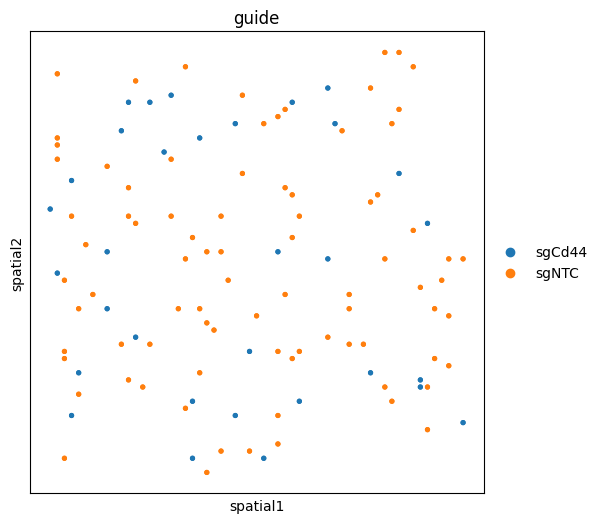

In [107]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
sq.pl.spatial_scatter(g_data[(g_data.obs["guide"] == "sgCd44") | (g_data.obs["guide"] == "sgNTC")], color="guide", shape=None, size=30, library_id="spatial", ax=ax)

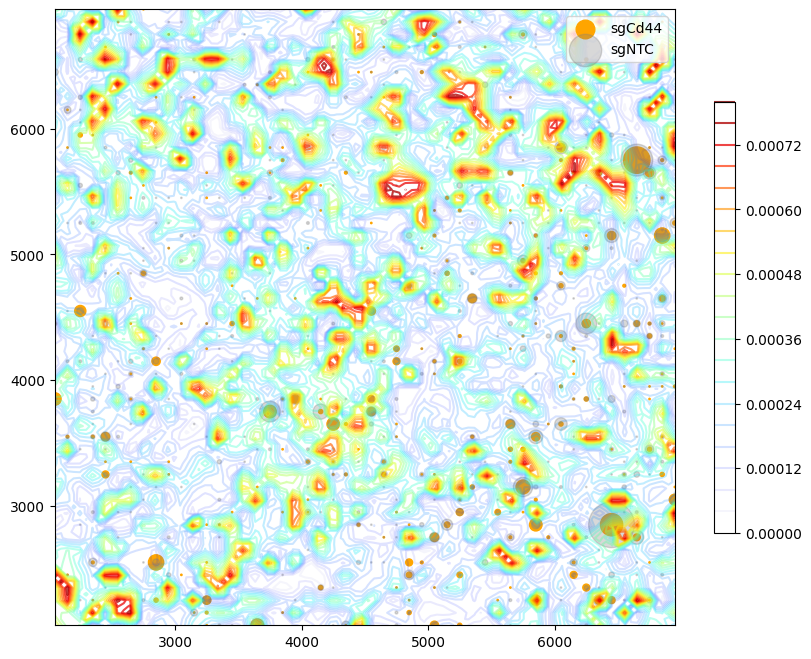

In [233]:
# Assuming plot_data is your AnnData object and apo_bin is the gene expression data
x_region = (2000, 7000)
y_region = (2000, 7000)

plot_data = utils.extract_region(fdata_, x_region, y_region)
apo_bin = plot_data.obs["stiff_fibro_mean"]
hypo_coord = plot_data.obsm['spatial']

# Create DataFrame with spatial coordinates and gene expression values
coord_df = pd.DataFrame({
    'x_coord': hypo_coord[:, 0],
    'y_coord': hypo_coord[:, 1],
    'value': apo_bin
})

# Remove points with no data (NaN)
coord_df = coord_df.dropna()

# Pivot table to create a grid
coord_df_piv = pd.pivot_table(coord_df, values="value", index="y_coord", columns="x_coord", aggfunc=np.mean)
z = coord_df_piv.values
y = coord_df_piv.index.values
x = coord_df_piv.columns.values

# Create a colormap
color_map = plt.get_cmap("jet")
new_cmap = mcolors.ListedColormap(color_map(np.linspace(0, 1, 100)))
new_cmap.colors[:, -1] = np.linspace(0, 0.8, new_cmap.N)

# Interpolation
xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)
xi, yi = np.meshgrid(xi, yi)

# Flatten the x and y coordinates for griddata
points = np.array([coord_df['x_coord'].values, coord_df['y_coord'].values]).T
values = coord_df['value'].values
vmax = np.quantile(values, 0.95)
values = [vmax if v > vmax else v for v in values]
zi = griddata(points, values, (xi, yi), method='linear')

# Plot contour map
fig, ax = plt.subplots(figsize=(10, 8))
cs = ax.contour(xi, yi, zi, levels=20, cmap=new_cmap)
plt.colorbar(cs, ax=ax, shrink=0.7)

# colormap = cm.get_cmap("jet")
# colors = colormap(np.linspace(0, 1, len(plot_data.var_names)))
# for idx, guide in enumerate(plot_data.var_names):
#     utils.plot_dot(plot_data, guide, ax=ax, square=True, color=colors[idx])

utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgCd44", ax=ax, alpha=1)
utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), "sgNTC", ax=ax, alpha=0.3, color="Grey")
plt.legend()

# colormap = cm.get_cmap("jet")
# colors = colormap(np.linspace(0, 1, len(cdata_.var_names)))
# for idx, guide in enumerate(cdata_.var_names):
#     utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), guide, ax=ax, square=False, color=colors[idx])

# plt.xlabel('Spatial X')
# plt.ylabel('Spatial Y')
# plt.title('Contour Map of T score')
# #plt.legend()
# plt.gca().invert_yaxis()
# plt.show()
# x_region = (0, 8000)
# y_region = (0, 8000)
# fig, ax = plt.subplots(1, 1, figsize=(10, 10))
# sq.pl.spatial_scatter(utils.extract_region(fdata_, x_region, y_region), color="t_mean", size=100, shape=None, cmap="Blues",ax=ax)
# plt.legend()

#colormap = cm.get_cmap("jet")
#colors = colormap(np.linspace(0, 1, len(cdata_.var_names)))
#for idx, guide in enumerate(cdata_.var_names):
#    utils.plot_dot(utils.extract_region(cdata_, x_region, y_region), guide, ax=ax, square=False, color=colors[idx], alpha=0.1)